# Project 2 MTH 5320

# Characterising Thumbnail Features Using Convolutional Neural Networks

David E. Nieves-Acaron

Dr. Ryan White

15 November 2021



## Data Preparation

The data was prepared in three steps:

- I took the list of collected YouTube videos from the last project and downloaded the default thumbnails for each image 
- I uploaded these images to a labeling solution known as LabelStudio to be able to label them quickly.
- I labeled the images (10k).
- I uploaded the images to ElasticSearch for ease of visualization.

### Downloading Images

The same list of YouTube video ID's from the last project were used to download the thumbnails for each image. For reference, the default thumbnail for a YouTube video given by its ID is ```https://img.youtube.com/vi/<video["id"]>/hqdefault.jpg```.

The videos were then downloaded to local storage. The code for this can be found in ```GatherImage.py```.

### LabelStudio

In order to label images quickly, dedicated software for it is a must. For this reason, I looked into some labeling solutions. My first instinct was AWS's SageMaker Ground Truth since it has dedicated image labeling features which make it very easy to label images quickly. 

In [8]:
import matplotlib.pyplot as plt 
import matplotlib.image as mpimg
def display_image(image_path):
    image = mpimg.imread(image_path)
    plt.figure(figsize=(200,100))
    plt.imshow(image)
    plt.show()

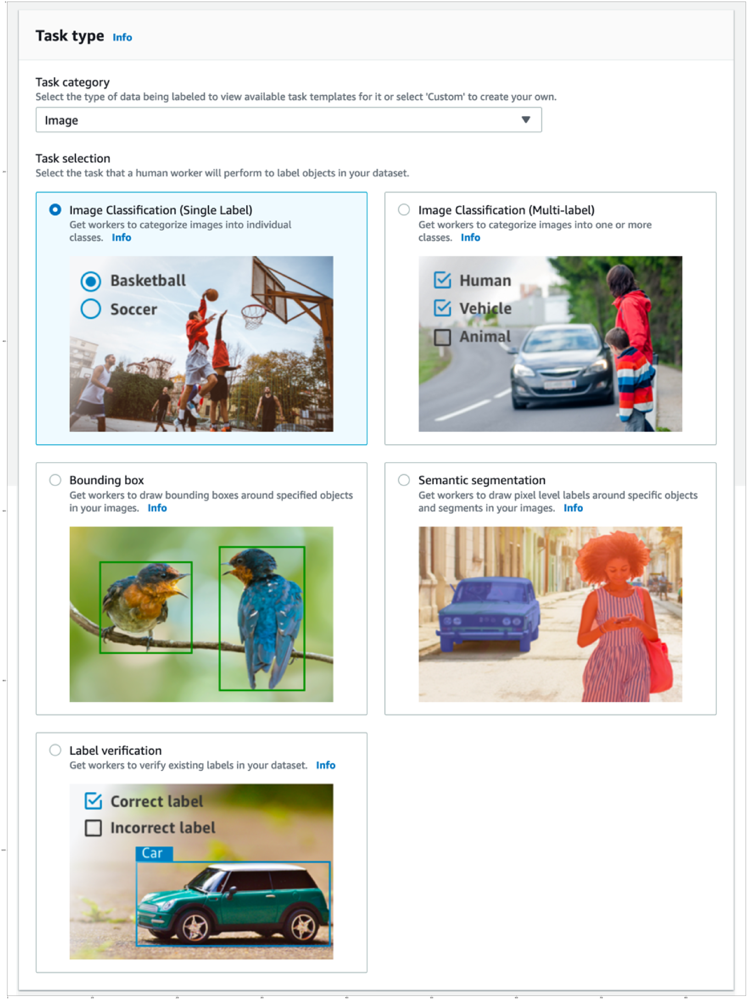

In [9]:
display_image(r"C:\Users\SplashFreeze\Desktop\Semester 7\MTH 4312\Project2\report_images\sagemaker.png")

However, given the pricing per image labeled for the service, the entire dataset (10k images in this case), would have cost roughly $800.

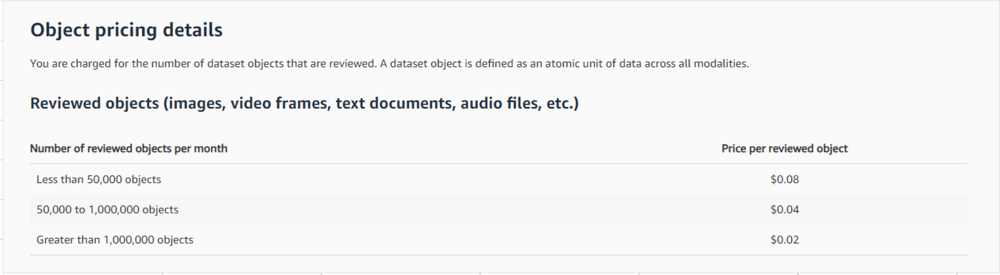

In [10]:
display_image(r"C:\Users\SplashFreeze\Desktop\Semester 7\MTH 4312\Project2\report_images\sagemaker_price.png")

For that reason, a free (open-source preferred but not necessary) solution was needed. It is then that I chose [LabelStudio](https://labelstud.io/), as I had heard of its capabilities earlier. The installation for LabelStudio was fairly straightforward, and I only needed to follow the Quick-Start guide to get it up and running. It can support many different image labeling tasks, as shown below:


In [13]:
display_image(r"C:\Users\SplashFreeze\Desktop\Semester 7\MTH 4312\Project2\report_images\label_studio_1.png")

Moreover, it has many customisable shortcuts and features that make labeling faster for the user and most important of all: it exports the labels in many different non-proprietary formats, as shown below:

In [14]:
display_image(r"C:\Users\SplashFreeze\Desktop\Semester 7\MTH 4312\Project2\report_images\label_studio_2.png")

With that, I set off to label 10k images. At first, I was wildly optimistic, and I thought I could get 50k done. However, as the deadline grew nearer, I realized that I was going to have to settle for 10k images and perform image augmentation if necessary. This is what the interface for labeling looked like:

In [11]:
display_image(r"C:\Users\SplashFreeze\Desktop\Semester 7\MTH 4312\Project2\report_images\labeling_interface.png")

A histogram of the labeling effort can be seen below (note that Kibana is missing some samples, so the amount shown should actually be higher). The time for the histogram is automatically recorded by LabelStudio every time a new label is submitted. This histogram is also a part of the Kibana Dashboard that I made, which will be the professor, and is accessible to the GSA upon request.

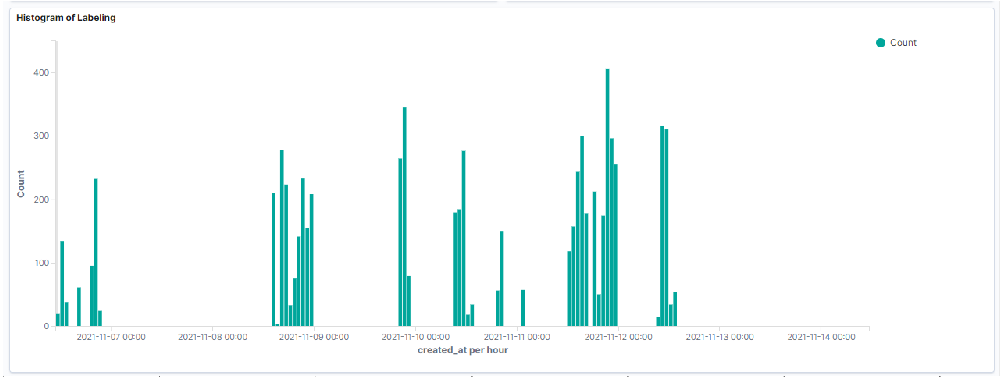

In [12]:
display_image(r"C:\Users\SplashFreeze\Desktop\Semester 7\MTH 4312\Project2\report_images\label_histogram.png")

### Uploading to ElasticSearch

The labeling data was uploaded to ElasticSearch so that it could be more easily visualized. Below are some screenshots of the ElasticSearch dashboard.

In [16]:
display_image(r"C:\Users\SplashFreeze\Desktop\Semester 7\MTH 4312\Project2\report_images\dashboard_1.png")

In [15]:
display_image(r"C:\Users\SplashFreeze\Desktop\Semester 7\MTH 4312\Project2\report_images\dashboard_2.png")

In [17]:
display_image(r"C:\Users\SplashFreeze\Desktop\Semester 7\MTH 4312\Project2\report_images\dashboard_channels.png")

In all, 10000 images were labeled, though for some unknown reason, not all appear on ElasticSearch. The file ``finished-labels.json``` contains all the data in its raw form. Here is a brief printout of what it looks like.

```
[
  {
    "image": "/data/local-files/?d=home/davidn/Documents/MTH-5320/Project2/copy-channels/TeCYeM46Fb8.jpg",
    "id": 1159,
    "choice": {
      "choices": [
        "Weapons",
        "Violence",
        "Anime/Cartoon"
      ]
    },
    "annotator": "dnievesacaro2018@my.fit.edu",
    "annotation_id": 464,
    "created_at": "2021-11-06T20:52:48.617085Z",
    "updated_at": "2021-11-06T20:53:19.391374Z",
    "lead_time": 939.092
  },
  {
    "image": "/data/local-files/?d=home/davidn/Documents/MTH-5320/Project2/copy-channels/KXaEHOxgs2w.jpg",
    "id": 730,
    "choice": {
      "choices": [
        "Weapons",
        "Anime/Cartoon",
        "Text"
      ]
    },
    "annotator": "dnievesacaro2018@my.fit.edu",
    "annotation_id": 35,
    "created_at": "2021-11-06T15:14:16.843908Z",
    "updated_at": "2021-11-06T15:15:05.872726Z",
    "lead_time": 1428.015
  }
  .
  .
  .
]
```

Now we will discuss how the decision for each label was made and what each one means a bit more in-depth


- Adult content : mostly erotic or suggestive content

- Weapons : mostly guns, but also includes knives and other blade weapons such as swords and spears 

- Violence : usually takes the form of shooting at someone in the case of games that are of the First Person Shooter genre



In [19]:
display_image(r"C:\Users\SplashFreeze\Desktop\Semester 7\MTH 4312\Project2\report_images\Violence.png")

- Minecraft : any screenshot or content of the minecraft game itself. It does include thumbnails where minecraft characters are shown, 
though slightly altered or cartoonified, such as the one below:



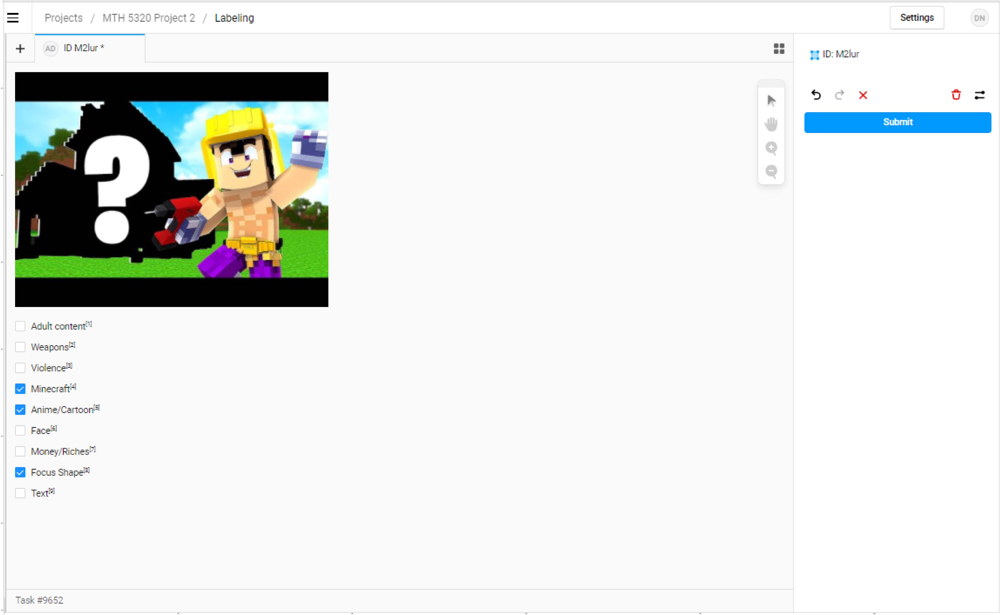

In [22]:
display_image(r"C:\Users\SplashFreeze\Desktop\Semester 7\MTH 4312\Project2\report_images\cartoony_minecraft.png")

... as well as just simple screenshots of minecraft or thumbnails that contain screenshots of the game.

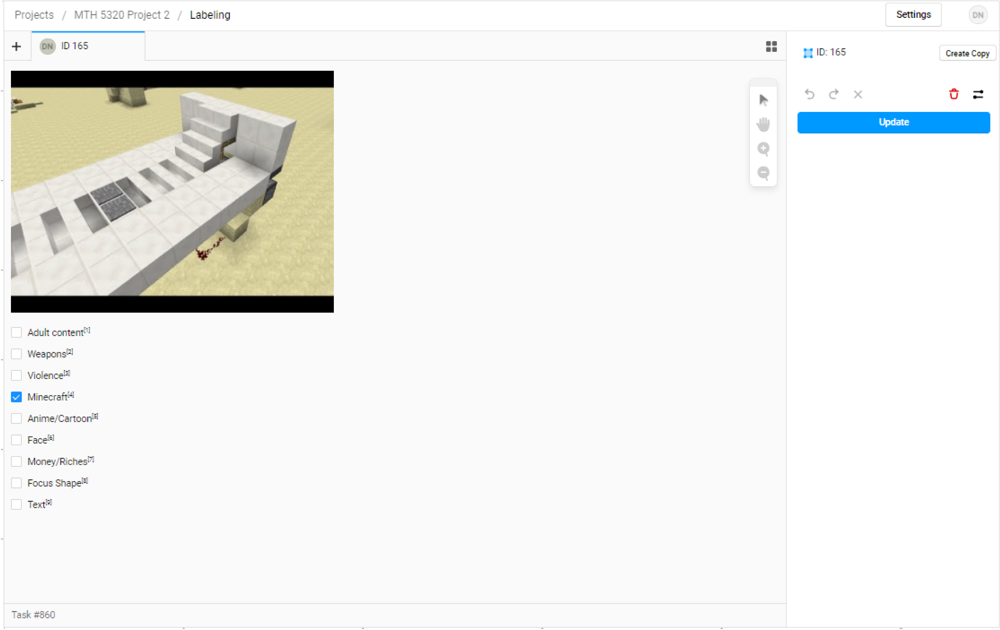

In [21]:
display_image(r"C:\Users\SplashFreeze\Desktop\Semester 7\MTH 4312\Project2\report_images\minecraft_screenshot.png")

There are also some other types of Minecraft related screenshots such as those where a screenshot of the game's GUI is shown.

Overall, I can see the Minecraft class being one of the most difficult classes for the model to identify, given that is a game with a large following and that many content creators have developed different screenshots for the game.



- Anime/Cartoon : this can represent in general a class belonging to thumbnails which contain "cartoony" content which is not very realistic looking. Sometimes it is from actual cartoons (be it the YouTuber having a cartoony avatar to display in the thumbnail), and sometimes it is from the contents of the game itself. Here is an example:


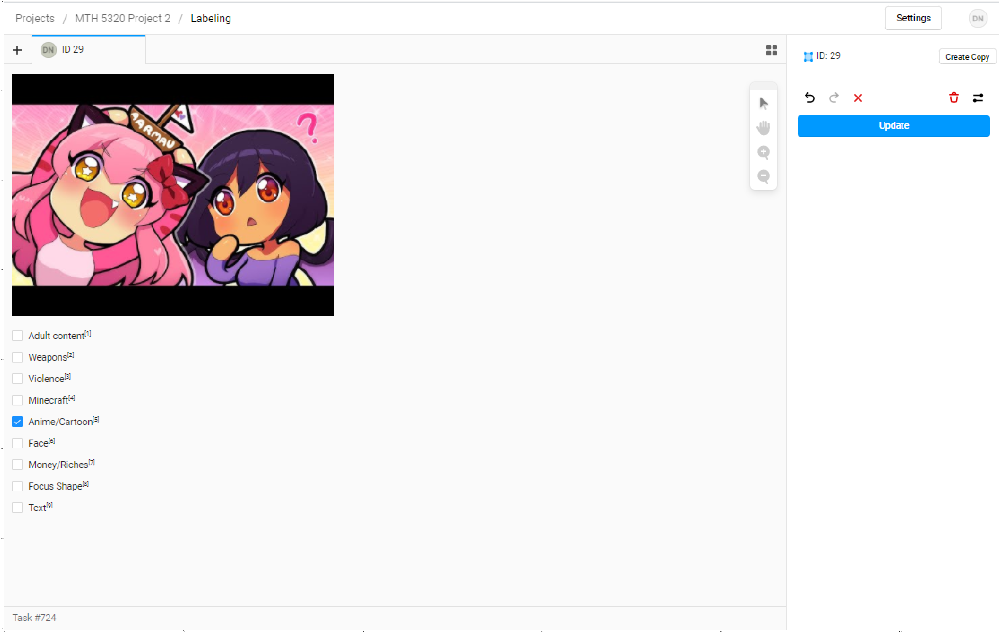

In [23]:
display_image(r"C:\Users\SplashFreeze\Desktop\Semester 7\MTH 4312\Project2\report_images\cartoon.png")

This class could also be very complicated for the model as there are many different art styles for cartoons. Additonally, there are some edge cases where the cartoon itself might contain a semi-realistic face. The line between realism and cartoony-ness can get blurred for some games.



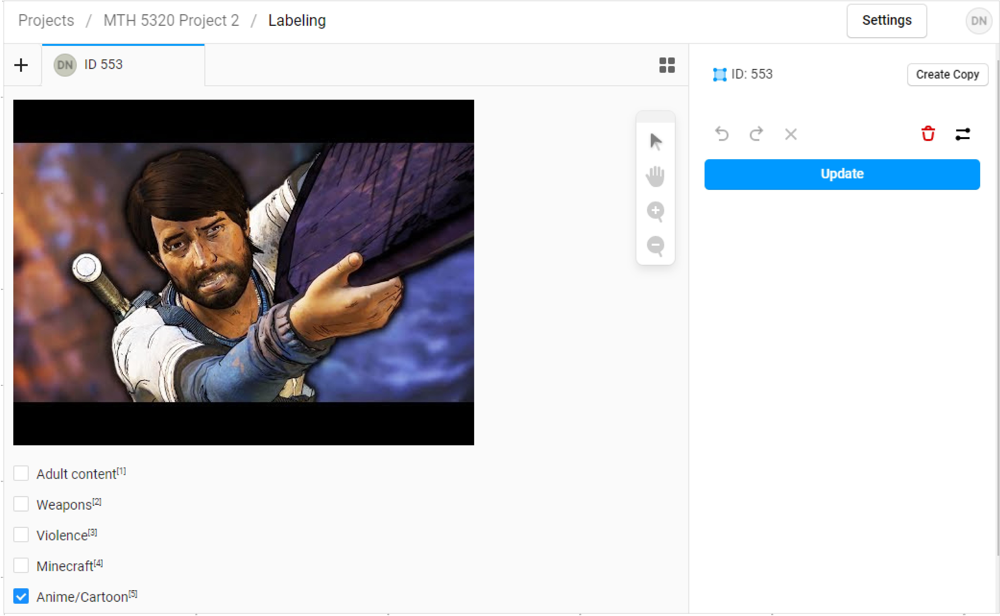

In [24]:
display_image(r"C:\Users\SplashFreeze\Desktop\Semester 7\MTH 4312\Project2\report_images\almost_face.png")


- Face : human and near-human faces (such as the one seen above). This feature is of interest to any person trying to make a video go viral because most humans are inevitably drawn to other human faces. For this reason, the so-called "thumbnail face" has become a sensation associated with viral videos with a thumbnail containing a human face making an exagerated expression, like so:

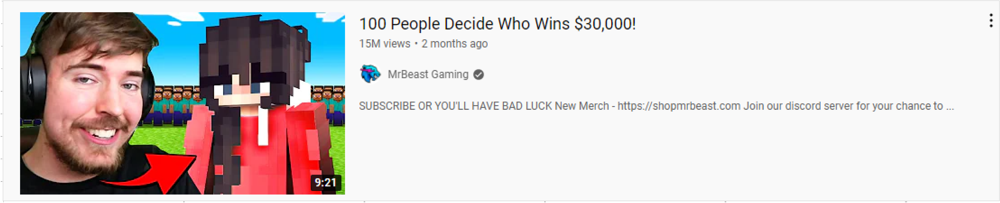

In [25]:
display_image(r"C:\Users\SplashFreeze\Desktop\Semester 7\MTH 4312\Project2\report_images\reaction_face_example.png")

- Money/Riches : these are mostly used in Minecraft videos to draw viewers in, especially due to the nature of finding riches such as diamonds or gold in the game. It is also present in other games, such as with dollar bills and gold objects. Overall, it is one of the most rare classes of them all, and it is also a class for which there is lots of variety in the way in which it is expressed. For this reason, I am thinking of gettting rid of it in the future.


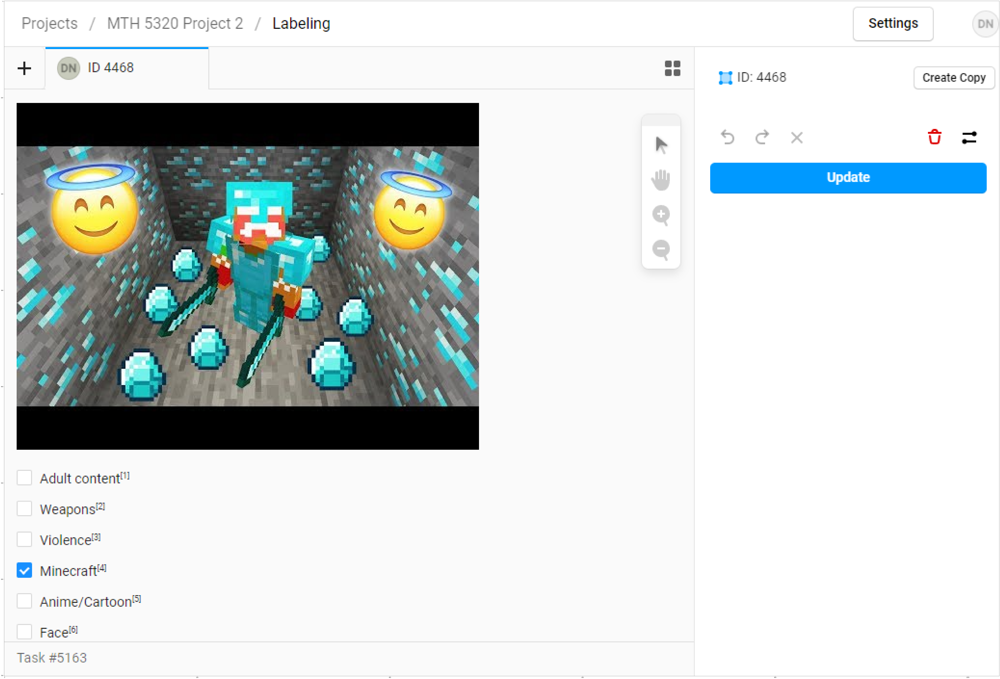

In [26]:
display_image(r"C:\Users\SplashFreeze\Desktop\Semester 7\MTH 4312\Project2\report_images\money_riches.png")



- Focus Shape : Focus shapes is a term I came up with to describe the arrows, red circles, and other visual cues used to direct the viewer's attention when glancing at a thumbnail. It is among the simplest of the classes in the labels. These examples will be illustrative of what I mean:


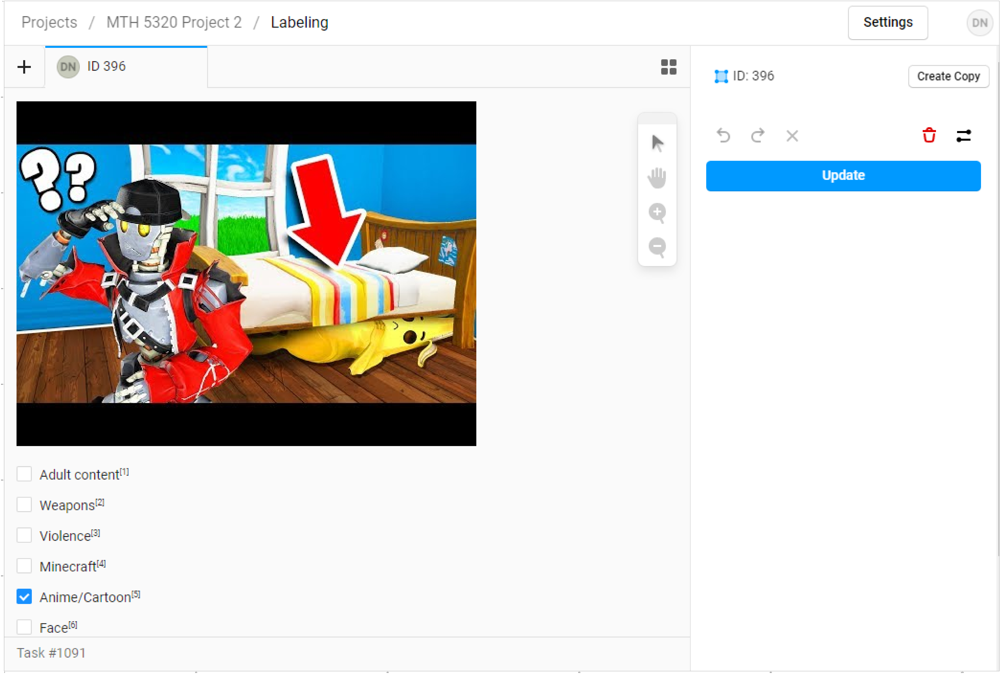

In [27]:
display_image(r"C:\Users\SplashFreeze\Desktop\Semester 7\MTH 4312\Project2\report_images\focus_shapes.png")

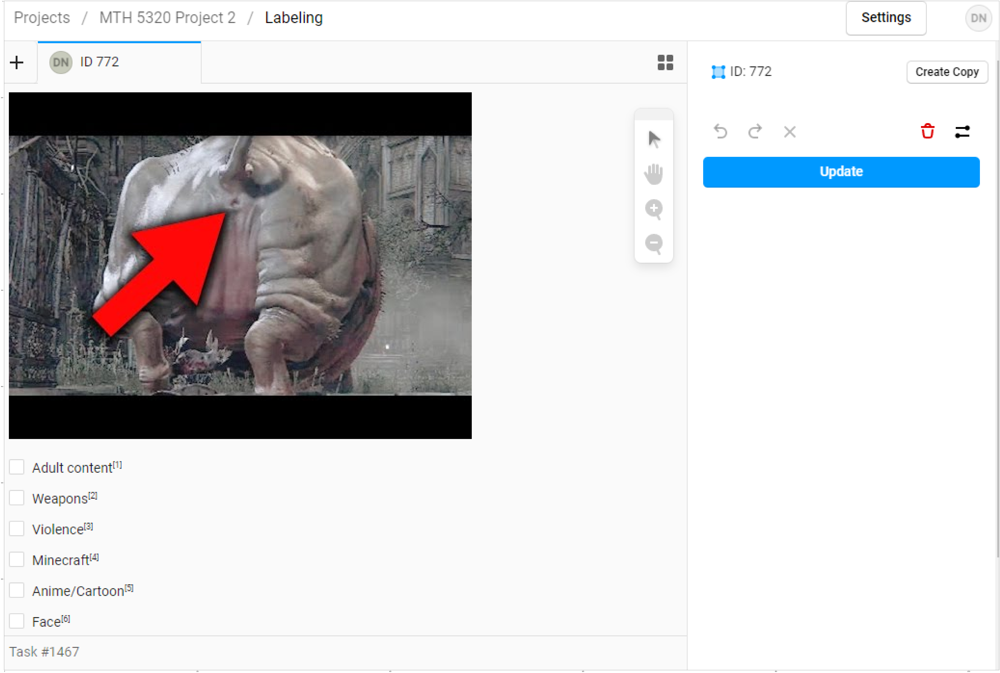

In [28]:
display_image(r"C:\Users\SplashFreeze\Desktop\Semester 7\MTH 4312\Project2\report_images\focus_shapes_2.png")

- Text : This is possibly the simplest out of all the labels in the set of labels. It simply involves text. One caveat is that it does include text from other languages, such as Korean and Spanish. For this reason, I can imagine that models that try to classify the text may be confused between symbols that seem like text. However, this is not a large concern given that most of the images in the dataset do not contain such symbols. 

## Classification models

First, I will prepare the data by reading from the ```finished-labels.json``` file to load in the labels. For now, no image augmentation will take place unless it is shown to be needed.

In [6]:
import ast
labels_file = open("finished-labels.json", "r")
labels_file_dump = labels_file.read()
labels_arr = ast.literal_eval(labels_file_dump)
input_images = []
labels = []


for i in (labels_arr):
    input_images.append(i["image"])
    if("choice" in i):
        if("choices" in i["choice"]):
            labels.append(i["choice"]["choices"])
        else:
            labels.append([i["choice"]])
    else:
        # Sometimes I decided that there was nothing of interest in the picture, for which I put in a Nothing class.
        labels.append(["None"])
        # id_dict[i["image"]] = ["None"]

# print(list(id_dict.items())[10:])
print(input_images[:1])
print(labels[:1])
print(len(input_images))
print(len(labels))




['/data/local-files/?d=home/davidn/Documents/MTH-5320/Project2/copy-channels/TeCYeM46Fb8.jpg']
[['Weapons', 'Violence', 'Anime/Cartoon']]
10000
10000


For this, we will need to use our own modified version of the SimpleImageProcessor. For starters, we will crop all images down to their actual content, given that YouTube attaches a horizontal bar above and below the image as part of the "HQ Default" thumbnail 

(accessible by entering ```https://img.youtube.com/vi/videoID/hqdefault.jpg``` in a URL ).

Below is an example:

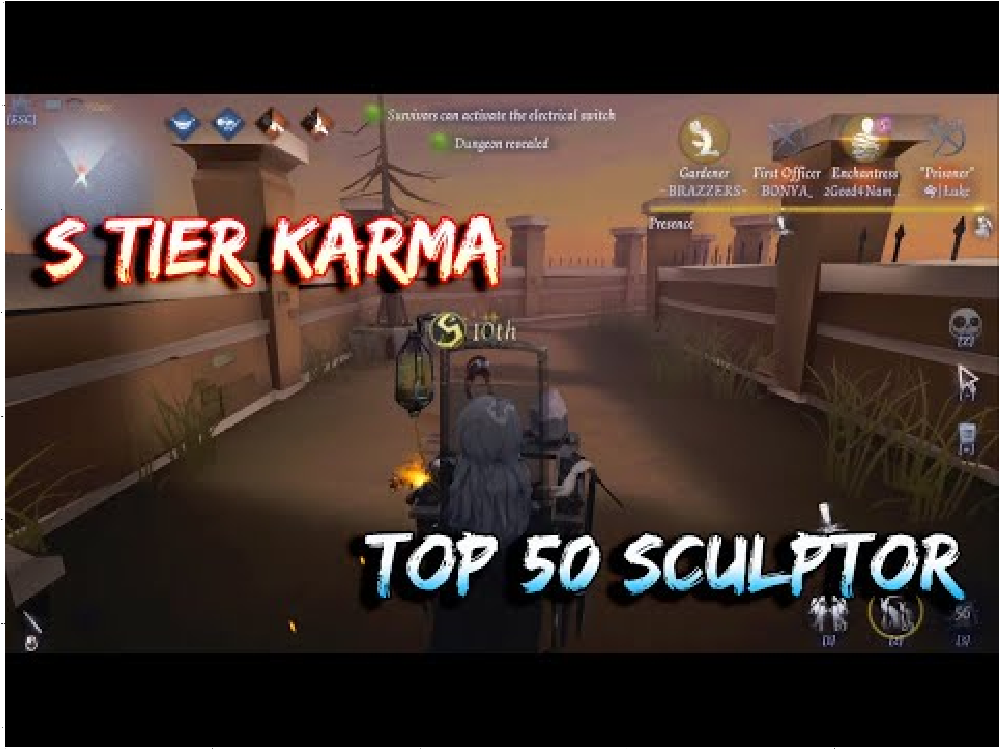

In [30]:
display_image(r"C:\Users\SplashFreeze\Desktop\Semester 7\MTH 4312\Project2\channels\UC-hSZv6tzHEUqrUB6mgXvIA\_i0tl-Xi6Nk.jpg")

As such, we will first measure the distances to these black bars so that we can get rid of them. We will inspect the image using an image manipulation program (in this case, paint.NET). It can be seen that the black pixels extend down until pixel coordinate 44 (starting from an index of 0). 

In [29]:
display_image(r"C:\Users\SplashFreeze\Desktop\Semester 7\MTH 4312\Project2\border.png")


In [1]:
import cv2
import os
import numpy as np
from imutils import paths
from random import randint

class SimpleImagePreprocessor:
    def __init__(self, width, height, cWidth = 0, cHeight = 0, cropAugment = 1, interpolation = cv2.INTER_AREA):
        self.width = width
        self.height = height
        self.cWidth = cWidth
        self.cHeight = cHeight
        self.interpolation = interpolation
        self.cropAugment = cropAugment
        self.translationAugment = 0
        
    def resize(self, image):
        return [cv2.resize(image, (self.width, self.height), interpolation = self.interpolation)]
    
    def randomCrop(self, image):
        images = []
        
        image = image[0]
        
        for counter in np.arange(0, self.cropAugment):
            lowerLeftX = randint(0, self.width - self.cWidth)
            lowerLeftY = randint(0, self.height - self.cHeight)
            
            images.append(image[lowerLeftY:lowerLeftY + self.cHeight, lowerLeftX:lowerLeftX + self.cWidth])
            
        return images
    
    def translate(self, image, pixels = 2):        
        leftImage = np.roll(image, pixels)
        rightImage = np.roll(image, -pixels)
        upImage = np.roll(image, pixels, axis = 0)
        downImage = np.roll(image, -pixels, axis = 0)
        
        images = [image]
                
        return images
        
class SimpleImageDatasetLoader:
    def __init__(self, cropAugment = 1, preprocessors = None):
        self.cropAugment = cropAugment
        self.translationAugment = 0
        self.preprocessors = preprocessors
    
        if self.preprocessors is None:
            self.preprocessors = []
            
        if preprocessor.translate in self.preprocessors:
            self.translationAugment = 4
            
    def load(self, imagePaths, verbose = -1, bw = 0):
        data = []
        labels = []
        
        for (i, imagePath) in enumerate(imagePaths):
            if bw == 1:
                image = cv2.imread(imagePath, cv2.IMREAD_GRAYSCALE)
            else:
                image = cv2.imread(imagePath)
            
            data.append(image)
                        
            if verbose > 0 and i > 0 and (i + 1) % verbose == 0:
                print('[INFO] processed {}/{}'.format(i + 1, len(imagePaths)))
                
        # return the data and labels in numpy arrays
        return np.array(data)

In [2]:
imagePaths = list(paths.list_images(r"C:\Users\SplashFreeze\Desktop\Semester 7\MTH 4312\Project2\final_label_files"))

preprocessor = SimpleImagePreprocessor(28, 28)

dataLoader = SimpleImageDatasetLoader(1, preprocessors = [])
data = dataLoader.load(imagePaths, verbose = 1000, bw =1)


[INFO] processed 1000/9993
[INFO] processed 2000/9993
[INFO] processed 3000/9993
[INFO] processed 4000/9993
[INFO] processed 5000/9993
[INFO] processed 6000/9993
[INFO] processed 7000/9993
[INFO] processed 8000/9993
[INFO] processed 9000/9993


In [3]:
trainX = data.astype('float32')/255.0
trainX = trainX[:,44:360 - 44,:]
print(trainX.shape)

(9993, 272, 480)


We will show the results of the cropping. This cropping will save processing time.

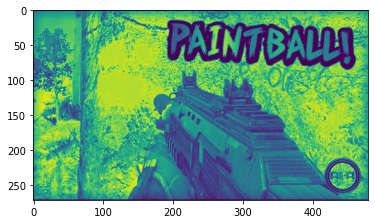

In [37]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

plt.imshow(trainX[2])
plt.show()

In [4]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from tensorflow.keras.datasets import mnist
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.utils import to_categorical
from keras.layers import Conv2D,Dense,MaxPooling2D, Activation, Flatten, Dropout
from keras.models import Sequential


Now we will show how the labels are mapped.

In [7]:
mappings = {0:"Adult content", 1:"Weapons", 2:"Violence",4:"Minecraft", 5:"Anime/Cartoon", 6:"Face", 7:"Money/Riches", 8:"Focus Shape", 9:"Text", 10:"None"}
mappings_list = list(mappings.values())
labels_mapped = []
for itemCounter, items in enumerate(labels):
    # labels_mapped.append([mappings_list.index(items[x]) for x in items])
    u = [mappings_list.index(x) for x in items]
    output = [0] * len(mappings_list)
    for label_indx in u:
        output[label_indx] =  1
    if(itemCounter == 0):
        print(items)
        print(output)
        print(u)


    labels_mapped.append(output)
print(labels_mapped[0])

trainY = np.array(labels_mapped)
trainY.shape

['Weapons', 'Violence', 'Anime/Cartoon']
[0, 1, 1, 0, 1, 0, 0, 0, 0, 0]
[1, 2, 4]
[0, 1, 1, 0, 1, 0, 0, 0, 0, 0]


(10000, 10)

## Benchmarking

As a benchmark, I will run a very simple convolutional model. It should give me an idea of how well it can perform.

In [10]:
class ShallowNet:
    # create the architecture
    def build(height, width, depth, numFilters, classes):
        # create a feedforward neural net
        model = Sequential()
        
        model.add(Conv2D(numFilters, (3, 3), padding='same', input_shape = (height, width, depth)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D())
        
        model.add(Flatten())
        model.add(Dense(classes))
        model.add(Activation('softmax'))
        
        return model

import tensorflow as tf

tf.keras.backend.clear_session()

(temp_trainX, temp_trainY) = (trainX, trainY)

temp_trainX = np.expand_dims(temp_trainX, -1)

print(temp_trainX.shape, temp_trainY.shape)
model = ShallowNet.build(temp_trainX.shape[1], temp_trainX.shape[2], 1, 32, temp_trainY.shape[1])
model.compile(loss = 'mean_squared_error', optimizer = SGD(0.001), metrics = ['binary_accuracy'])
model.summary()

print("[INFO] training network...")
maxIt = 50
H = model.fit(temp_trainX, temp_trainY, validation_split = 0.20, batch_size = 8, epochs = 1, verbose = 1,shuffle=True)

from seaborn import heatmap
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

import matplotlib.pyplot as plt

# predict the labels of the test set
predictedY = model.predict(temp_trainX)



(9993, 272, 480, 1) (10000, 10)
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 272, 480, 32)      320       
_________________________________________________________________
activation (Activation)      (None, 272, 480, 32)      0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 136, 240, 32)      0         
_________________________________________________________________
flatten (Flatten)            (None, 1044480)           0         
_________________________________________________________________
dense (Dense)                (None, 10)                10444810  
_________________________________________________________________
activation_1 (Activation)    (None, 10)                0         
Total params: 10,445,130
Trainable params: 10,445,130
Non-trainable params: 0
____________

As can be seen, the model does decently, though one should be careful with the binary accuracy metric since a lot of accuracy can be obtained by simply guessing now for a lot of the labels (particularly the rare ones). Let's try running some variations of this to see how this model can be improved.

## Run I

For starters, we will begin with a variation of ShallowNet to sort of "test out the waters" with regards to seeing how the model does. We will be using binary accuracy with is since it takes the accuracy of all binary predictions (what is trying to be done here) as opposed to regular accuracy which takes the average of all predictions. 

In [42]:
class ShallowNet:
    # create the architecture
    def build(height, width, depth, numFilters, classes):
        # create a feedforward neural net
        model = Sequential()
        
        model.add(Conv2D(numFilters, (3, 3), padding='same', input_shape = (height, width, depth)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D())
        
        model.add(Flatten())
        model.add(Dense(classes))
        # softmax is meant for more only 1, go for sigmoid
        # softmax reduces all values equally, wheras sigmoid will be the true value
        model.add(Activation('sigmoid'))
        
        return model

import tensorflow as tf

tf.keras.backend.clear_session()
# print(trainX.shape, trainY.shape)

(temp_trainX, temp_trainY) = (trainX, trainY)

temp_trainX = np.expand_dims(temp_trainX, -1)

print(temp_trainX.shape, temp_trainY.shape)
model = ShallowNet.build(temp_trainX.shape[1], temp_trainX.shape[2], 1, 32, temp_trainY.shape[1])
# accuracy will do one class per thing
# have to use binary_accuracy since it is on an element by element basis
model.compile(loss = 'mean_squared_error', optimizer = Adam(0.001), metrics = ['binary_accuracy'])
# model.summary()

print("[INFO] training network...")
maxIt = 50
H = model.fit(temp_trainX, temp_trainY, validation_split = 0.20, batch_size = 8, epochs = 1, verbose = 1,shuffle=True)

from seaborn import heatmap
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

import matplotlib.pyplot as plt

# predict the labels of the test set
predictedY = model.predict(temp_trainX)



(9993, 272, 480, 1) (10000, 10)
[INFO] training network...
1000/1000 [==============================] - 374s 372ms/step - loss: 0.1472 - binary_accuracy: 0.8524 - val_loss: 0.1378 - val_binary_accuracy: 0.8622


In [43]:
print(predictedY[:10])
print(trainY[:10])

[[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00 0.0000000e+00 0.0000000e+00 1.0000000e+00 0.0000000e+00]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00 0.0000000e+00 0.0000000e+00 1.0000000e+00 0.0000000e+00]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00 0.0000000e+00 0.0000000e+00 1.0000000e+00 0.0000000e+00]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00 0.0000000e+00 0.0000000e+00 1.0000000e+00 0.0000000e+00]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00 0.0000000e+00 0.0000000e+00 1.0000000e+00 0.0000000e+00]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00 0.0000000e+00 0.0000000e+00 1.0000000e+00 0.0000000e+00]
 [0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00 0.0000000e+00 0.0000000e+00 1.0000000e+00 

## Run II 

As can be seen above, the model seems to be doing really well, (binary accuracy of 0.8524) but it is primarily because a large part of the entries in the labels are already 0's. Additionally, it seems to predict many 1's in the 8th place, which corresponds to the "text" class. This makes sense as text is one of the most prevalent classes in the data. Because of this, I will first run a deeper version of ShallowNet to see if it can do better with the data. Afterwards, I will see if removing some of the less important classes can make the model hone in more deeply and classify more accurately. 

In [44]:
class ShallowNet:
    # create the architecture
    def build(height, width, depth, numFilters, classes):
        # create a feedforward neural net
        model = Sequential()
        
        model.add(Conv2D(numFilters, (3, 3), padding='same', input_shape = (height, width, depth)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D())

        model.add(Conv2D(numFilters, (3, 3), padding='same', input_shape = (height, width, depth)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D())

        model.add(Conv2D(numFilters, (3, 3), padding='same', input_shape = (height, width, depth)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D())
        
        model.add(Flatten())
        model.add(Dense(classes))
        # softmax is meant for more only 1, go for sigmoid
        # softmax reduces all values equally, wheras sigmoid will be the true value
        model.add(Activation('sigmoid'))
        
        return model

import tensorflow as tf

tf.keras.backend.clear_session()
# print(trainX.shape, trainY.shape)

(temp_trainX, temp_trainY) = (trainX, trainY)

temp_trainX = np.expand_dims(temp_trainX, -1)

print(temp_trainX.shape, temp_trainY.shape)
model = ShallowNet.build(temp_trainX.shape[1], temp_trainX.shape[2], 1, 32, temp_trainY.shape[1])
# accuracy will do one class per thing
# have to use binary_accuracy since it is on an element by element basis
model.compile(loss = 'mean_squared_error', optimizer = Adam(0.001), metrics = ['binary_accuracy'])
# model.summary()

print("[INFO] training network...")
maxIt = 50
H = model.fit(temp_trainX, temp_trainY, validation_split = 0.20, batch_size = 8, epochs = 1, verbose = 1,shuffle=True)

from seaborn import heatmap
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

import matplotlib.pyplot as plt

# predict the labels of the test set
predictedY = model.predict(temp_trainX)



(9993, 272, 480, 1) (10000, 10)
[INFO] training network...
1000/1000 [==============================] - 603s 602ms/step - loss: 0.1098 - binary_accuracy: 0.8520 - val_loss: 0.1080 - val_binary_accuracy: 0.8622


In [45]:
print(predictedY[:10])
print(trainY[:10])

[[0.02802768 0.18019089 0.06831354 0.19248065 0.45474502 0.2975207
  0.03173023 0.13872507 0.6929365  0.0758754 ]
 [0.02862576 0.18028179 0.0689162  0.19281963 0.45482883 0.2960142
  0.03230429 0.13910195 0.6918937  0.07625341]
 [0.02856058 0.17932165 0.06882218 0.19322076 0.45511875 0.29505444
  0.03223044 0.13989586 0.6914623  0.07663468]
 [0.02871841 0.18093982 0.06911215 0.19396761 0.455105   0.29587203
  0.03238189 0.13987216 0.6914959  0.07699892]
 [0.02870613 0.18162993 0.06937024 0.19479778 0.45456484 0.29748017
  0.03242028 0.14013782 0.6908562  0.07711476]
 [0.02733362 0.17819864 0.06682554 0.19183278 0.4510603  0.29402018
  0.0309754  0.13705319 0.6967722  0.07434192]
 [0.02881423 0.18207905 0.06960705 0.19498771 0.45465937 0.2979514
  0.03253978 0.14058137 0.69048196 0.07739908]
 [0.02806118 0.17960519 0.068048   0.19295609 0.45427862 0.2957055
  0.03168911 0.13812    0.6925049  0.07577252]
 [0.02878129 0.1817446  0.06941536 0.19464785 0.45439878 0.29769546
  0.03246808 0.1

As can be seen above, the results do seem to be a bit more nuanced now, with the model not being so binary now. However, it is still trending towards predicting text. Surprisingly, the model did slightly worse on the binary accuracy. One detail that I should discuss is that the current optimizer being used is Adam for its converging capabilities. I will try out a different activation function first, and see how much better it does. Then, I might try out a different optimizer.

## Run III 

This time, I will try out the ELU activation function to see if salvaging that below zero part can bring about more accuracy.

In [7]:
class ShallowNet:
    # create the architecture
    def build(height, width, depth, numFilters, classes):
        # create a feedforward neural net
        model = Sequential()
        
        model.add(Conv2D(numFilters, (3, 3), padding='same', input_shape = (height, width, depth)))
        model.add(Activation('elu'))
        model.add(MaxPooling2D())

        model.add(Conv2D(numFilters, (3, 3), padding='same', input_shape = (height, width, depth)))
        model.add(Activation('elu'))
        model.add(MaxPooling2D())

        
        model.add(Flatten())
        model.add(Dense(classes))
        # softmax is meant for more only 1, go for sigmoid
        # softmax reduces all values equally, wheras sigmoid will be the true value
        model.add(Activation('sigmoid'))
        
        return model

import tensorflow as tf

tf.keras.backend.clear_session()
# print(trainX.shape, trainY.shape)

(temp_trainX, temp_trainY) = (trainX, trainY)

temp_trainX = np.expand_dims(temp_trainX, -1)

print(temp_trainX.shape, temp_trainY.shape)
model = ShallowNet.build(temp_trainX.shape[1], temp_trainX.shape[2], 1, 32, temp_trainY.shape[1])
# accuracy will do one class per thing
# have to use binary_accuracy since it is on an element by element basis
model.compile(loss = 'mean_squared_error', optimizer = Adam(0.001), metrics = ['binary_accuracy'])
# model.summary()

print("[INFO] training network...")
maxIt = 50
H = model.fit(temp_trainX, temp_trainY, validation_split = 0.20, batch_size = 8, epochs = 1, verbose = 1,shuffle=True)

from seaborn import heatmap
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

import matplotlib.pyplot as plt




(9993, 272, 480, 1) (10000, 10)
[INFO] training network...
1000/1000 [==============================] - 734s 733ms/step - loss: 0.1561 - binary_accuracy: 0.8437 - val_loss: 0.1378 - val_binary_accuracy: 0.8622


## Run III

That did not seem to do much better. Let us try using other activation functions, specifically those that map from 0 to 1 such as sigmoid, tanh.

In [8]:
class ShallowNet:
    # create the architecture
    def build(height, width, depth, numFilters, classes):
        # create a feedforward neural net
        model = Sequential()
        
        model.add(Conv2D(numFilters, (3, 3), padding='same', input_shape = (height, width, depth)))
        model.add(Activation('sigmoid'))
        model.add(MaxPooling2D())

        model.add(Conv2D(numFilters, (3, 3), padding='same', input_shape = (height, width, depth)))
        model.add(Activation('sigmoid'))
        model.add(MaxPooling2D())

        
        model.add(Flatten())
        model.add(Dense(classes))
        # softmax is meant for more only 1, go for sigmoid
        # softmax reduces all values equally, wheras sigmoid will be the true value
        model.add(Activation('sigmoid'))
        
        return model

import tensorflow as tf

tf.keras.backend.clear_session()
# print(trainX.shape, trainY.shape)

(temp_trainX, temp_trainY) = (trainX, trainY)

temp_trainX = np.expand_dims(temp_trainX, -1)

print(temp_trainX.shape, temp_trainY.shape)
model = ShallowNet.build(temp_trainX.shape[1], temp_trainX.shape[2], 1, 32, temp_trainY.shape[1])
# accuracy will do one class per thing
# have to use binary_accuracy since it is on an element by element basis
model.compile(loss = 'mean_squared_error', optimizer = Adam(0.001), metrics = ['binary_accuracy'])
# model.summary()

print("[INFO] training network...")
maxIt = 50
H = model.fit(temp_trainX, temp_trainY, validation_split = 0.20, batch_size = 8, epochs = 1, verbose = 1,shuffle=True)

from seaborn import heatmap
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

import matplotlib.pyplot as plt





(9993, 272, 480, 1) (10000, 10)
[INFO] training network...
1000/1000 [==============================] - 618s 618ms/step - loss: 0.2146 - binary_accuracy: 0.7853 - val_loss: 0.2051 - val_binary_accuracy: 0.7949


## Run IV 

That clearly did worse, so let us try using a tanh activation function. My guess is that it will lead to similar, if not worse results due to how poorly and slowly the previous results went. Indeed, ReLU seems to be our strongest activation function candidate at the moment.

In [9]:
class ShallowNet:
    # create the architecture
    def build(height, width, depth, numFilters, classes):
        # create a feedforward neural net
        model = Sequential()
        
        model.add(Conv2D(numFilters, (3, 3), padding='same', input_shape = (height, width, depth)))
        model.add(Activation('tanh'))
        model.add(MaxPooling2D())

        model.add(Conv2D(numFilters, (3, 3), padding='same', input_shape = (height, width, depth)))
        model.add(Activation('tanh'))
        model.add(MaxPooling2D())

        
        model.add(Flatten())
        model.add(Dense(classes))
        # softmax is meant for more only 1, go for sigmoid
        # softmax reduces all values equally, wheras sigmoid will be the true value
        model.add(Activation('sigmoid'))
        
        return model

import tensorflow as tf

tf.keras.backend.clear_session()
# print(trainX.shape, trainY.shape)

(temp_trainX, temp_trainY) = (trainX, trainY)

temp_trainX = np.expand_dims(temp_trainX, -1)

print(temp_trainX.shape, temp_trainY.shape)
model = ShallowNet.build(temp_trainX.shape[1], temp_trainX.shape[2], 1, 32, temp_trainY.shape[1])
# accuracy will do one class per thing
# have to use binary_accuracy since it is on an element by element basis
model.compile(loss = 'mean_squared_error', optimizer = Adam(0.001), metrics = ['binary_accuracy'])
# model.summary()

print("[INFO] training network...")
maxIt = 50
H = model.fit(temp_trainX, temp_trainY, validation_split = 0.20, batch_size = 8, epochs = 1, verbose = 1,shuffle=True)

from seaborn import heatmap
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

import matplotlib.pyplot as plt



(9993, 272, 480, 1) (10000, 10)
[INFO] training network...
1000/1000 [==============================] - 593s 591ms/step - loss: 0.1888 - binary_accuracy: 0.8109 - val_loss: 0.1782 - val_binary_accuracy: 0.8218


## Run V

That certainly did better than the tanh activation set, but it is still not up to par with ReLU. Based on the faltering results of ELU, I believe other variations of ReLU will not provide substantial benefits. Nonetheless, it is an avenue I should explore. I will start with selu. The SeLU (scaled exponential linear unit) consits of $$f(x) = \lambda x $$  if  $$ x \geq 0 $$  and $$ f(x) = \lambda \alpha (exp(x) - 1)$$ if $$x < 0 $$. I hope that like ELU, it will be able to make up a little bit for the lost part where $x \leq 0$.

In [7]:
class ShallowNet:
    # create the architecture
    def build(height, width, depth, numFilters, classes):
        # create a feedforward neural net
        model = Sequential()
        
        model.add(Conv2D(numFilters, (3, 3), padding='same', input_shape = (height, width, depth)))
        model.add(Activation('selu'))
        model.add(MaxPooling2D())

        model.add(Conv2D(numFilters, (3, 3), padding='same', input_shape = (height, width, depth)))
        model.add(Activation('selu'))
        model.add(MaxPooling2D())

        
        model.add(Flatten())
        model.add(Dense(classes))
        # softmax is meant for more only 1, go for sigmoid
        # softmax reduces all values equally, wheras sigmoid will be the true value
        model.add(Activation('sigmoid'))
        
        return model

import tensorflow as tf

tf.keras.backend.clear_session()
# print(trainX.shape, trainY.shape)

(temp_trainX, temp_trainY) = (trainX, trainY)

temp_trainX = np.expand_dims(temp_trainX, -1)

print(temp_trainX.shape, temp_trainY.shape)
model = ShallowNet.build(temp_trainX.shape[1], temp_trainX.shape[2], 1, 32, temp_trainY.shape[1])
# accuracy will do one class per thing
# have to use binary_accuracy since it is on an element by element basis
model.compile(loss = 'mean_squared_error', optimizer = Adam(0.001), metrics = ['binary_accuracy'])
# model.summary()

print("[INFO] training network...")
maxIt = 50
H = model.fit(temp_trainX, temp_trainY, validation_split = 0.20, batch_size = 8, epochs = 1, verbose = 1,shuffle=True)

from seaborn import heatmap
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

import matplotlib.pyplot as plt




(9993, 272, 480, 1) (10000, 10)
[INFO] training network...
1000/1000 [==============================] - 643s 640ms/step - loss: 0.1634 - binary_accuracy: 0.8364 - val_loss: 0.1724 - val_binary_accuracy: 0.8276


## Run VI

That did not seem too promising. Next I will try the gelu activation function, which is the gaussian error linear unit. It is a relatively new type of activation function and it consists of having a cumulative ditribution of Gaussian distribution multiplied by x. It follows the pattern of the other ReLU family functions in that it tries to salvage some values from when x is less than 0. Let us see if it does better.

In [8]:
class ShallowNet:
    # create the architecture
    def build(height, width, depth, numFilters, classes):
        # create a feedforward neural net
        model = Sequential()
        
        model.add(Conv2D(numFilters, (3, 3), padding='same', input_shape = (height, width, depth)))
        model.add(Activation('gelu'))
        model.add(MaxPooling2D())

        model.add(Conv2D(numFilters, (3, 3), padding='same', input_shape = (height, width, depth)))
        model.add(Activation('gelu'))
        model.add(MaxPooling2D())

        
        model.add(Flatten())
        model.add(Dense(classes))
        # softmax is meant for more only 1, go for sigmoid
        # softmax reduces all values equally, wheras sigmoid will be the true value
        model.add(Activation('sigmoid'))
        
        return model

import tensorflow as tf

tf.keras.backend.clear_session()
# print(trainX.shape, trainY.shape)

(temp_trainX, temp_trainY) = (trainX, trainY)

temp_trainX = np.expand_dims(temp_trainX, -1)

print(temp_trainX.shape, temp_trainY.shape)
model = ShallowNet.build(temp_trainX.shape[1], temp_trainX.shape[2], 1, 32, temp_trainY.shape[1])
# accuracy will do one class per thing
# have to use binary_accuracy since it is on an element by element basis
model.compile(loss = 'mean_squared_error', optimizer = Adam(0.001), metrics = ['binary_accuracy'])
# model.summary()

print("[INFO] training network...")
maxIt = 50
H = model.fit(temp_trainX, temp_trainY, validation_split = 0.20, batch_size = 8, epochs = 1, verbose = 1,shuffle=True)

from seaborn import heatmap
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

import matplotlib.pyplot as plt

# predict the labels of the test set
predictedY = model.predict(temp_trainX)



(9993, 272, 480, 1) (10000, 10)
[INFO] training network...
1000/1000 [==============================] - 955s 954ms/step - loss: 0.1512 - binary_accuracy: 0.8480 - val_loss: 0.1378 - val_binary_accuracy: 0.8622


## Run VII

Neither of the two previous ReLU family functions seem to have done much better. Let's try leaky ReLU now. 

In [9]:
class ShallowNet:
    # create the architecture
    def build(height, width, depth, numFilters, classes):
        # create a feedforward neural net
        model = Sequential()
        
        model.add(Conv2D(numFilters, (3, 3), padding='same', input_shape = (height, width, depth)))
        model.add(Activation('leaky_relu'))
        model.add(MaxPooling2D())

        model.add(Conv2D(numFilters, (3, 3), padding='same', input_shape = (height, width, depth)))
        model.add(Activation('leaky_relu'))
        model.add(MaxPooling2D())

        
        model.add(Flatten())
        model.add(Dense(classes))
        # softmax is meant for more only 1, go for sigmoid
        # softmax reduces all values equally, wheras sigmoid will be the true value
        model.add(Activation('sigmoid'))
        
        return model

import tensorflow as tf

tf.keras.backend.clear_session()
# print(trainX.shape, trainY.shape)

(temp_trainX, temp_trainY) = (trainX, trainY)

temp_trainX = np.expand_dims(temp_trainX, -1)

print(temp_trainX.shape, temp_trainY.shape)
model = ShallowNet.build(temp_trainX.shape[1], temp_trainX.shape[2], 1, 32, temp_trainY.shape[1])
# accuracy will do one class per thing
# have to use binary_accuracy since it is on an element by element basis
model.compile(loss = 'mean_squared_error', optimizer = Adam(0.001), metrics = ['binary_accuracy'])
# model.summary()

print("[INFO] training network...")
maxIt = 50
H = model.fit(temp_trainX, temp_trainY, validation_split = 0.20, batch_size = 8, epochs = 1, verbose = 1,shuffle=True)



(9993, 272, 480, 1) (10000, 10)
[INFO] training network...
1000/1000 [==============================] - 584s 583ms/step - loss: 0.1580 - binary_accuracy: 0.8413 - val_loss: 0.1724 - val_binary_accuracy: 0.8276


## Run VIII

Unfortunately, this did not look too promising either. Let us try out the swish activation function, while we're at it.

In [10]:
class ShallowNet:
    # create the architecture
    def build(height, width, depth, numFilters, classes):
        # create a feedforward neural net
        model = Sequential()
        
        model.add(Conv2D(numFilters, (3, 3), padding='same', input_shape = (height, width, depth)))
        model.add(Activation('swish'))
        model.add(MaxPooling2D())

        model.add(Conv2D(numFilters, (3, 3), padding='same', input_shape = (height, width, depth)))
        model.add(Activation('swish'))
        model.add(MaxPooling2D())

        
        model.add(Flatten())
        model.add(Dense(classes))
        # softmax is meant for more only 1, go for sigmoid
        # softmax reduces all values equally, wheras sigmoid will be the true value
        model.add(Activation('sigmoid'))
        
        return model

import tensorflow as tf

tf.keras.backend.clear_session()
# print(trainX.shape, trainY.shape)

(temp_trainX, temp_trainY) = (trainX, trainY)

temp_trainX = np.expand_dims(temp_trainX, -1)

print(temp_trainX.shape, temp_trainY.shape)
model = ShallowNet.build(temp_trainX.shape[1], temp_trainX.shape[2], 1, 32, temp_trainY.shape[1])
# accuracy will do one class per thing
# have to use binary_accuracy since it is on an element by element basis
model.compile(loss = 'mean_squared_error', optimizer = Adam(0.001), metrics = ['binary_accuracy'])
# model.summary()

print("[INFO] training network...")
maxIt = 50
H = model.fit(temp_trainX, temp_trainY, validation_split = 0.20, batch_size = 8, epochs = 1, verbose = 1,shuffle=True)



(9993, 272, 480, 1) (10000, 10)
[INFO] training network...
1000/1000 [==============================] - 795s 794ms/step - loss: 0.1878 - binary_accuracy: 0.8115 - val_loss: 0.1782 - val_binary_accuracy: 0.8218


## Run IX

That did even worse. With that, it is probably safe to say that ReLU is the best activation function for the job, given that it had the highest binary accuracy. Next I will try using dropout on the layers to see if that can improve results. We will start out with a modest rate of 20% for the dropout and see if higher rates can lead to better results.

In [8]:
class ShallowNet:
    # create the architecture
    def build(height, width, depth, numFilters, classes):
        # create a feedforward neural net
        model = Sequential()
        
        model.add(Conv2D(numFilters, (3, 3), padding='same', input_shape = (height, width, depth)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D())
        model.add(Dropout(0.20))

        model.add(Conv2D(numFilters, (3, 3), padding='same', input_shape = (height, width, depth)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D())
        model.add(Dropout(0.20))

        model.add(Conv2D(numFilters, (3, 3), padding='same', input_shape = (height, width, depth)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D())
        
        model.add(Flatten())
        model.add(Dense(classes))
        # softmax is meant for more only 1, go for sigmoid
        # softmax reduces all values equally, wheras sigmoid will be the true value
        model.add(Activation('sigmoid'))
        
        return model

import tensorflow as tf

tf.keras.backend.clear_session()
# print(trainX.shape, trainY.shape)

(temp_trainX, temp_trainY) = (trainX, trainY)

temp_trainX = np.expand_dims(temp_trainX, -1)

print(temp_trainX.shape, temp_trainY.shape)
model = ShallowNet.build(temp_trainX.shape[1], temp_trainX.shape[2], 1, 32, temp_trainY.shape[1])
# accuracy will do one class per thing
# have to use binary_accuracy since it is on an element by element basis
model.compile(loss = 'mean_squared_error', optimizer = Adam(0.001), metrics = ['binary_accuracy'])
# model.summary()

print("[INFO] training network...")
maxIt = 50
H = model.fit(temp_trainX, temp_trainY, validation_split = 0.20, batch_size = 8, epochs = 1, verbose = 1,shuffle=True)

from seaborn import heatmap
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

import matplotlib.pyplot as plt

# predict the labels of the test set
predictedY = model.predict(temp_trainX)



(9993, 272, 480, 1) (10000, 10)
[INFO] training network...
1000/1000 [==============================] - 709s 707ms/step - loss: 0.1097 - binary_accuracy: 0.8517 - val_loss: 0.1072 - val_binary_accuracy: 0.8622


## Run X

Now we'll try out a higher dropout rate of 50% to see if it can improve results.

In [9]:
class ShallowNet:
    # create the architecture
    def build(height, width, depth, numFilters, classes):
        # create a feedforward neural net
        model = Sequential()
        
        model.add(Conv2D(numFilters, (3, 3), padding='same', input_shape = (height, width, depth)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D())
        model.add(Dropout(0.50))

        model.add(Conv2D(numFilters, (3, 3), padding='same', input_shape = (height, width, depth)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D())
        model.add(Dropout(0.50))

        model.add(Conv2D(numFilters, (3, 3), padding='same', input_shape = (height, width, depth)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D())
        
        model.add(Flatten())
        model.add(Dense(classes))
        # softmax is meant for more only 1, go for sigmoid
        # softmax reduces all values equally, wheras sigmoid will be the true value
        model.add(Activation('sigmoid'))
        
        return model

import tensorflow as tf

tf.keras.backend.clear_session()
# print(trainX.shape, trainY.shape)

(temp_trainX, temp_trainY) = (trainX, trainY)

temp_trainX = np.expand_dims(temp_trainX, -1)

print(temp_trainX.shape, temp_trainY.shape)
model = ShallowNet.build(temp_trainX.shape[1], temp_trainX.shape[2], 1, 32, temp_trainY.shape[1])
# accuracy will do one class per thing
# have to use binary_accuracy since it is on an element by element basis
model.compile(loss = 'mean_squared_error', optimizer = Adam(0.001), metrics = ['binary_accuracy'])
# model.summary()

print("[INFO] training network...")
maxIt = 50
H = model.fit(temp_trainX, temp_trainY, validation_split = 0.20, batch_size = 8, epochs = 1, verbose = 1,shuffle=True)

from seaborn import heatmap
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

import matplotlib.pyplot as plt

# predict the labels of the test set
predictedY = model.predict(temp_trainX)



(9993, 272, 480, 1) (10000, 10)
[INFO] training network...
1000/1000 [==============================] - 666s 665ms/step - loss: 0.1332 - binary_accuracy: 0.8443 - val_loss: 0.1074 - val_binary_accuracy: 0.8622


With these variations (primarily) in activation functions, as well as the variations in architecture, I will now conclude my report with my best results. I will not divulge into deeper models, as I was primarily interested in what made the model perform better. My best result was a binary accuracy of 0.8524 in Run I. The model used ReLU and was fairly shallow. The different variations of that model that I tried out were not particularly helpful for improving, though it remains to be seen how this could change in the future with deeper models running for longer iterations. 

## Conclusion

This project taught me a lot about streamlining the process of Data Labeling and why it is so important, even for big companies such as Tesla, and others, which actively get engineers to repeatedly label images so that their models can be state of the art. In addition, I learned what a difficult task the classification of different features of a YouTube video are due to how much the average content creator relies on context for the viewer to be able to pick up on the various meanings of a YouTube thumbnail. It is for this reason that classes such as the Minecraft and the Violence classes are so complicated.